# Demo: scRNA-seq analysis
**Prepared for:** Dr. Dennis Doe  
**Analysis by:** Yong Won Jin  
**Date modified:** 2022-06-19

In [43]:
import os
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

## <b> 1 <span style='color:#ffb2ae'> | </span> Introduction</b>

## <b> 2 <span style='color:#ffc967'> | </span> Data prep</b>

<div style='color: white; display: fill; 
    border-radius: 8px; background-color: #ffc967;
    font-size: 100%; letter-spacing:0.5px'> 
    <p style='padding: 8px; color: black;'> 
        <b>1.1 &nbsp; Load data </b>
    </p>
</div> 

In [236]:
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=60, facecolor='white')

In [5]:
pbmc33k = sc.read_10x_mtx('./pbmc33k_filtered_gene_bc_matrices/filtered_gene_bc_matrices/hg19/', 
                          var_names='gene_symbols')

In [7]:
pbmc33k

AnnData object with n_obs × n_vars = 33148 × 32738
    var: 'gene_ids'

<div style='color: white; display: fill; 
    border-radius: 8px; background-color: #ffc967;
    font-size: 100%; letter-spacing:0.5px'> 
    <p style='padding: 8px; color: black;'> 
        <b>1.2 &nbsp; Exploratory data analysis </b>
    </p>
</div> 

In [21]:
pbmc33k.to_df().iloc[0:5,0:5]

,MIR1302-10,FAM138A,OR4F5,RP11-34P13.7,RP11-34P13.8
AAACATTGACGACT-1,0.0,0.0,0.0,0.0,0.0
AAACATTGACGGGA-1,0.0,0.0,0.0,0.0,0.0
AAACATTGCCGCTT-1,0.0,0.0,0.0,0.0,0.0
AAACATTGCTCATT-1,0.0,0.0,0.0,0.0,0.0
AAACCGTGCCCTCA-1,0.0,0.0,0.0,0.0,0.0


In [13]:
pbmc33k.obs.head()

""
AAACATTGACGACT-1
AAACATTGACGGGA-1
AAACATTGCCGCTT-1
AAACATTGCTCATT-1
AAACCGTGCCCTCA-1


In [14]:
pbmc33k.var.head()

,gene_ids
MIR1302-10,ENSG00000243485
FAM138A,ENSG00000237613
OR4F5,ENSG00000186092
RP11-34P13.7,ENSG00000238009
RP11-34P13.8,ENSG00000239945


normalizing counts per cell


c:\users\yw_ji\appdata\local\programs\python\python37\lib\site-packages\scanpy\preprocessing\_normalization.py:197: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


    finished (0:00:00)


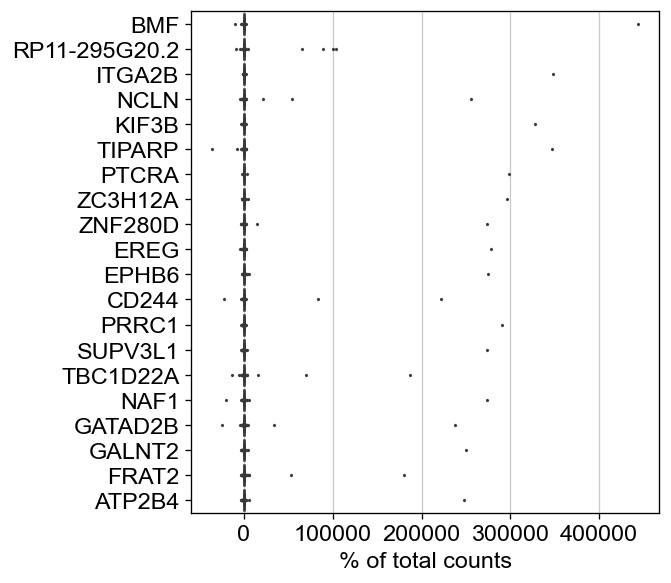

In [239]:
sc.pl.highest_expr_genes(pbmc33k, n_top=20)

In [30]:
# Search for prefix "MT-" (mitochondrial genes) and make new column in variable annotations
# Search for prefix "RPL/RPS" for ribosomal genes and "MRPL/MRPS" for mitochondrial ribosomal genes
pbmc33k.var['mito'] = pbmc33k.var_names.str.startswith('MT-')
pbmc33k.var['ribo'] = pbmc33k.var_names.str.startswith(('RPL','RPS'))
pbmc33k.var['mribo'] = pbmc33k.var_names.str.startswith(('MRPL','MRPS'))
# Calculate QC metrics as per McCarthy et al., 2017 (Scater)
sc.pp.calculate_qc_metrics(pbmc33k, qc_vars=['mito','ribo','mribo'], log1p=False, inplace=True)

In [34]:
pbmc33k.raw = pbmc33k

In [31]:
pbmc33k.obs.head()

,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mito,pct_counts_mito,total_counts_ribo,pct_counts_ribo,total_counts_mribo,pct_counts_mribo
AAACATTGACGACT-1,713,1935.0,45.426357,60.930233,73.436693,88.992248,28.0,1.447028,806.0,41.653748,10.0,0.516796
AAACATTGACGGGA-1,673,1342.0,39.120715,51.490313,64.754098,87.108793,40.0,2.980626,309.0,23.025335,3.0,0.223547
AAACATTGCCGCTT-1,354,720.0,47.222222,63.333333,78.611111,100.000000,13.0,1.805556,213.0,29.583332,2.0,0.277778
AAACATTGCTCATT-1,753,1604.0,38.279302,52.431421,65.523691,84.226933,52.0,3.241895,473.0,29.488777,6.0,0.374065
AAACCGTGCCCTCA-1,558,1313.0,44.402133,60.243717,72.734196,95.582635,26.0,1.980198,519.0,39.527798,3.0,0.228484


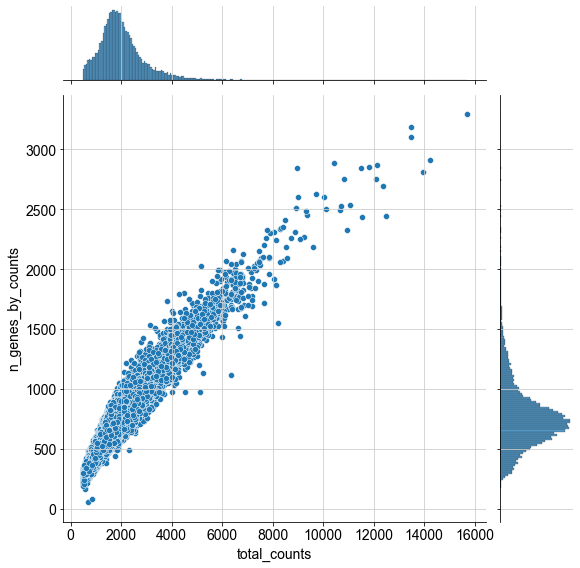

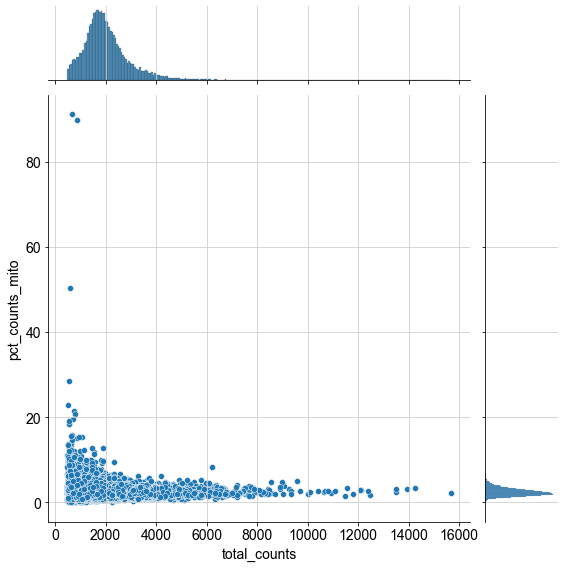

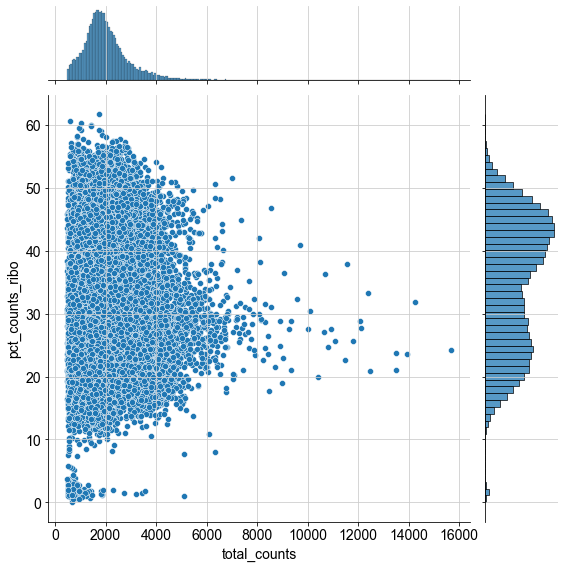

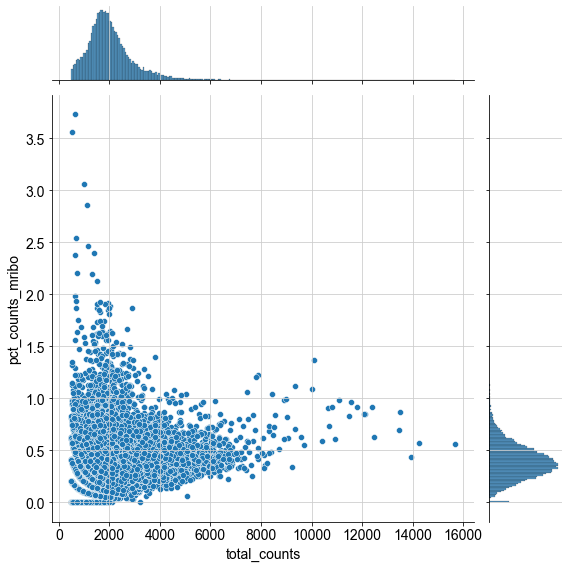

In [24]:
sns.jointplot(x='total_counts', y='n_genes_by_counts', height=8, data=pbmc33k.obs,
    kind='scatter')
sns.jointplot(x='total_counts', y='pct_counts_mito', height=8, data=pbmc33k.obs,
    kind='scatter')
sns.jointplot(x='total_counts', y='pct_counts_ribo', height=8, data=pbmc33k.obs,
    kind='scatter')
sns.jointplot(x='total_counts', y='pct_counts_mribo', height=8, data=pbmc33k.obs,
    kind='scatter')
plt.show()

In [29]:
pbmc33k.var.head()

,gene_ids,mito,ribo,mribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
MIR1302-10,ENSG00000243485,False,False,False,0,0.00000,100.000000,0.0
FAM138A,ENSG00000237613,False,False,False,0,0.00000,100.000000,0.0
OR4F5,ENSG00000186092,False,False,False,0,0.00000,100.000000,0.0
RP11-34P13.7,ENSG00000238009,False,False,False,0,0.00000,100.000000,0.0
RP11-34P13.8,ENSG00000239945,False,False,False,1,0.00003,99.996983,1.0


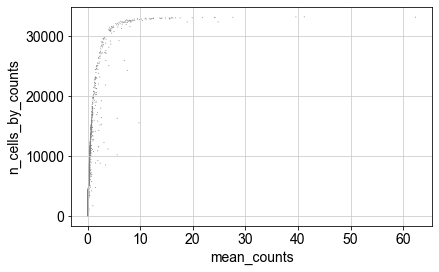

In [38]:
sc.pl.scatter(pbmc33k, x='mean_counts', y='n_cells_by_counts')

<div style='color: white; display: fill; 
    border-radius: 8px; background-color: #ffc967;
    font-size: 100%; letter-spacing:0.5px'> 
    <p style='padding: 8px; color: black;'> 
        <b>1.3 &nbsp; Pre-processing </b>
    </p>
</div> 

In [49]:
sc.pp.filter_cells(pbmc33k, min_genes=200)
sc.pp.filter_genes(pbmc33k, min_cells=3)
pbmc33k = pbmc33k[pbmc33k.obs.n_genes_by_counts < 2500, :]
pbmc33k = pbmc33k[pbmc33k.obs.pct_counts_mito < 5, :]
pbmc33k = pbmc33k[pbmc33k.obs.pct_counts_mribo < 1, :]

Trying to set attribute `.obs` of view, copying.


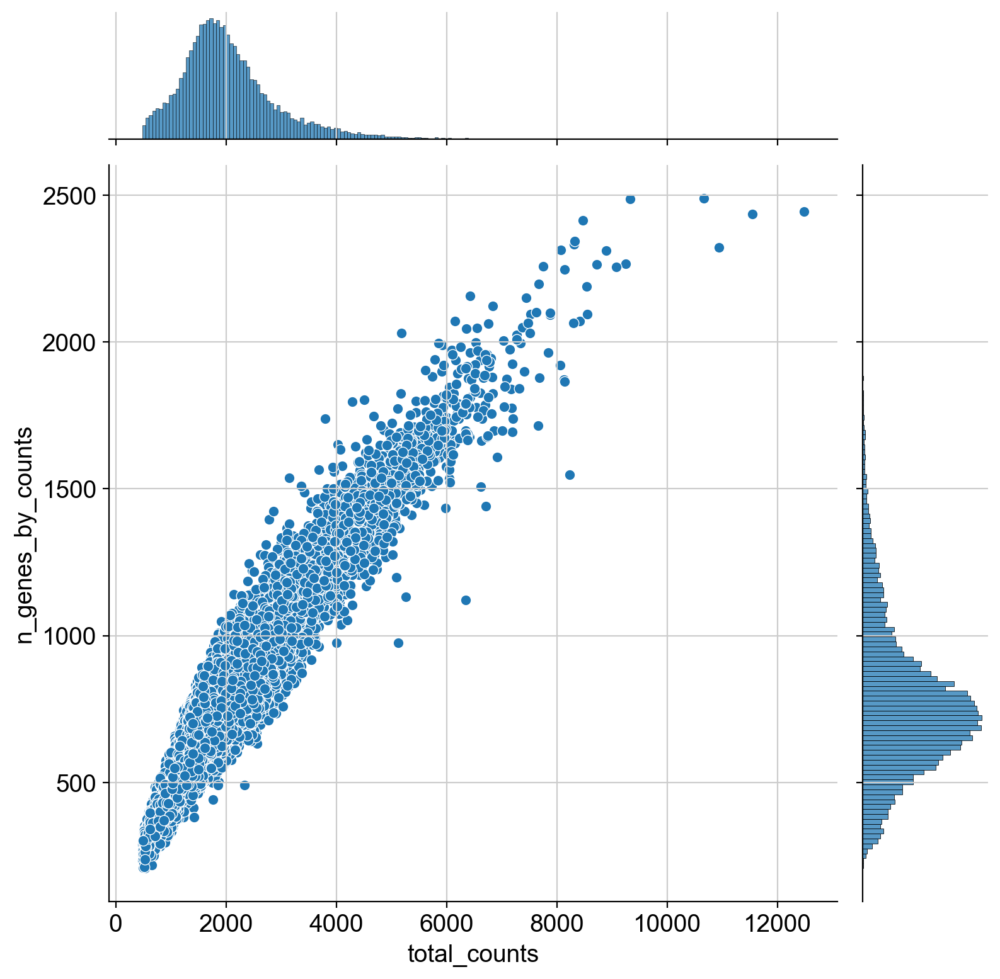

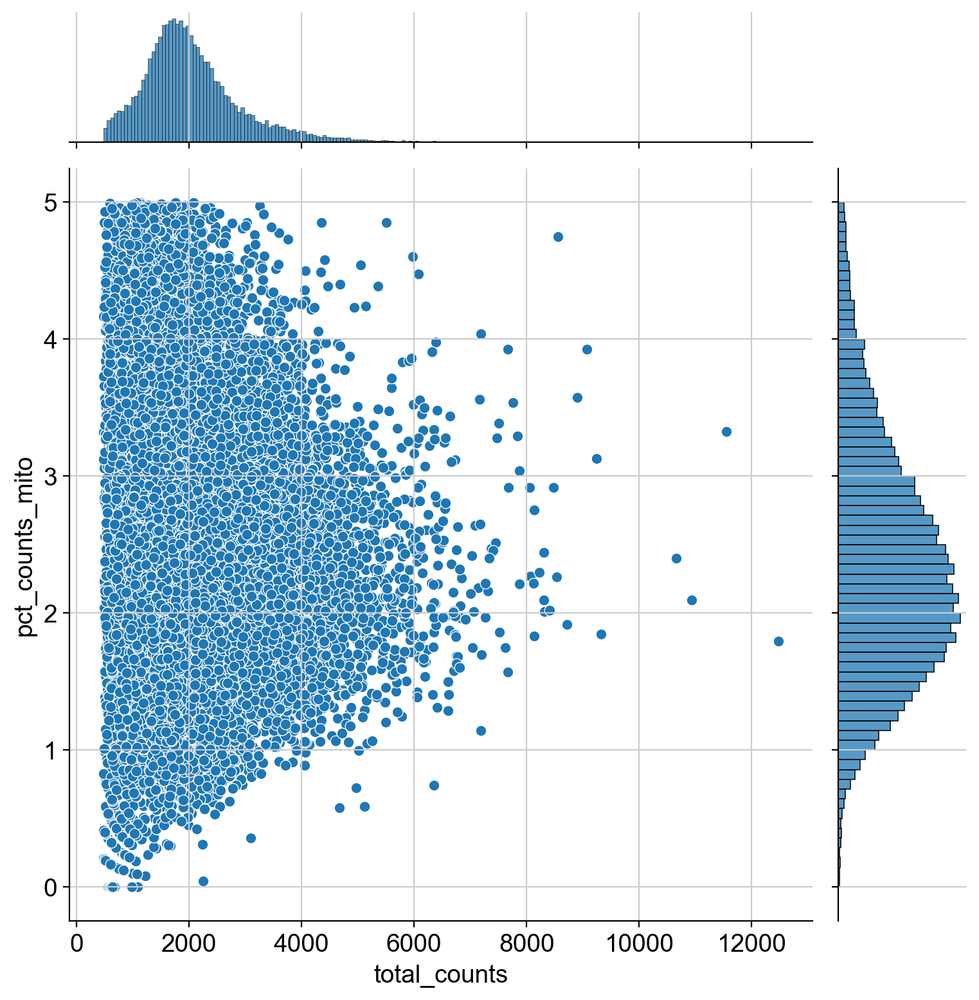

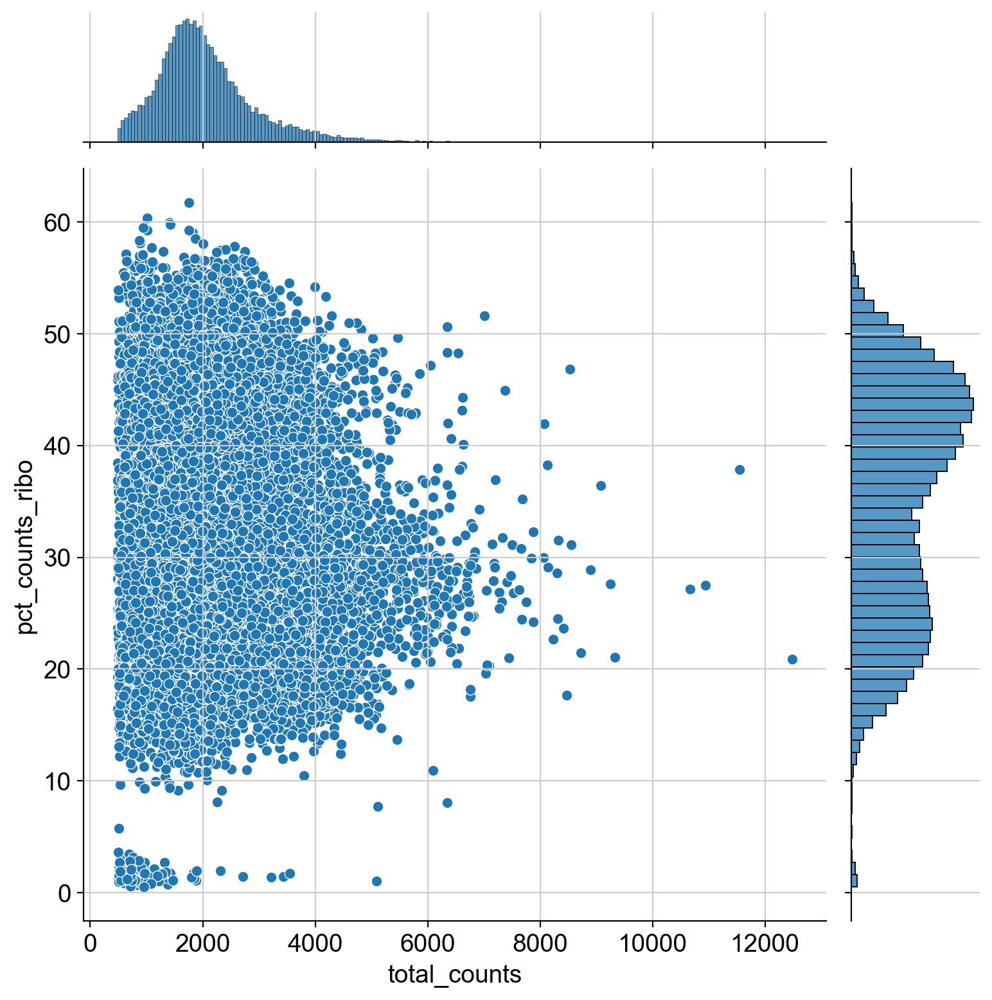

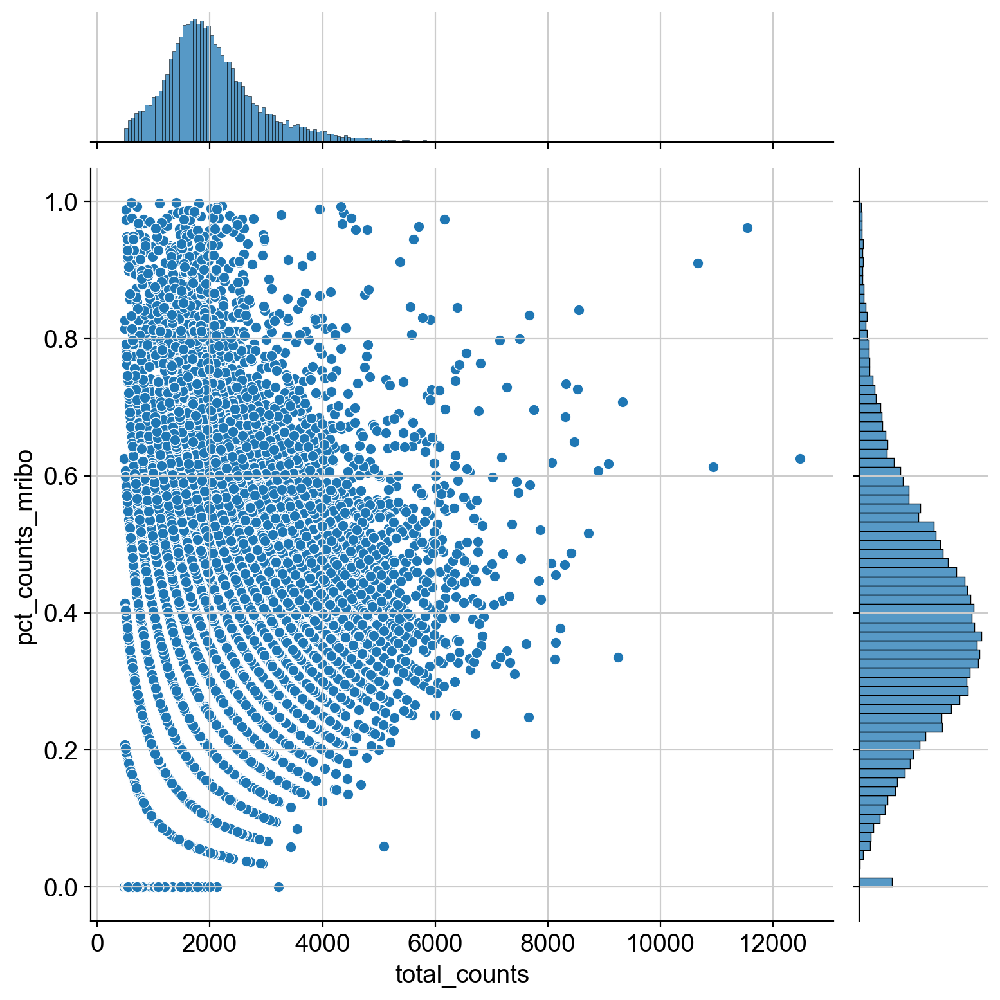

In [50]:
sns.jointplot(x='total_counts', y='n_genes_by_counts', height=8, data=pbmc33k.obs,
    kind='scatter')
sns.jointplot(x='total_counts', y='pct_counts_mito', height=8, data=pbmc33k.obs,
    kind='scatter')
sns.jointplot(x='total_counts', y='pct_counts_ribo', height=8, data=pbmc33k.obs,
    kind='scatter')
sns.jointplot(x='total_counts', y='pct_counts_mribo', height=8, data=pbmc33k.obs,
    kind='scatter')
plt.show()

In [51]:
sc.pp.normalize_total(pbmc33k, target_sum=1e4)

normalizing counts per cell


c:\users\yw_ji\appdata\local\programs\python\python37\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


In [52]:
sc.pp.log1p(pbmc33k)

In [53]:
sc.pp.highly_variable_genes(pbmc33k, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


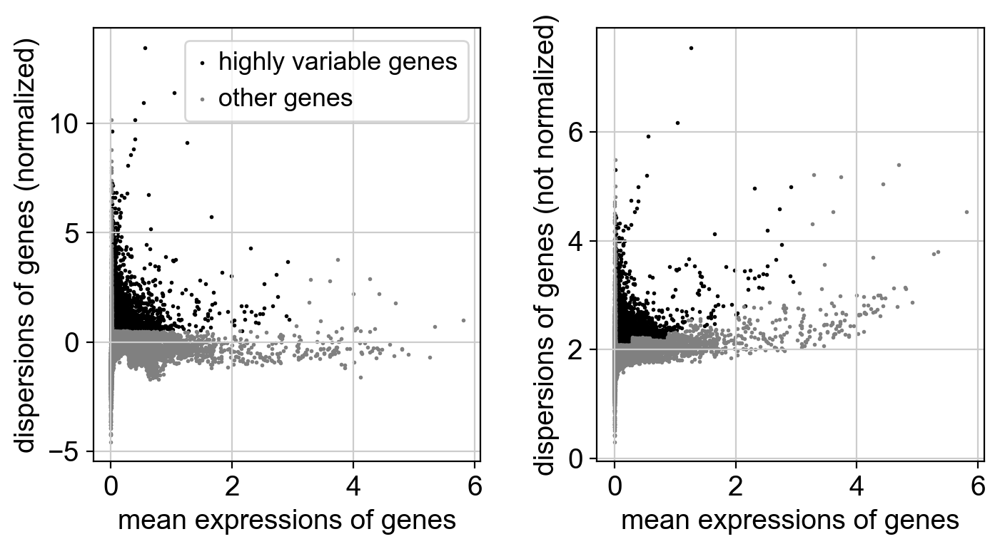

In [54]:
sc.pl.highly_variable_genes(pbmc33k)

In [55]:
pbmc33k.raw = pbmc33k

In [56]:
pbmc33k = pbmc33k[:, pbmc33k.var.highly_variable]

In [58]:
sc.pp.regress_out(pbmc33k, ['total_counts','pct_counts_mito'])

regressing out ['total_counts', 'pct_counts_mito']
    finished (0:00:43)


In [59]:
sc.pp.scale(pbmc33k, max_value=10)

In [60]:
sc.tl.pca(pbmc33k, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:11)


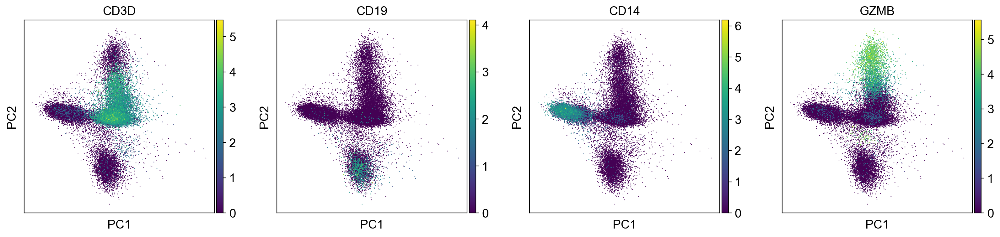

In [93]:
# pbmc33k.var_names[pbmc33k.var_names.str.startswith('GZMB')]
sc.pl.pca(pbmc33k, color=['CD3D', 'CD19','CD14','GZMB'])

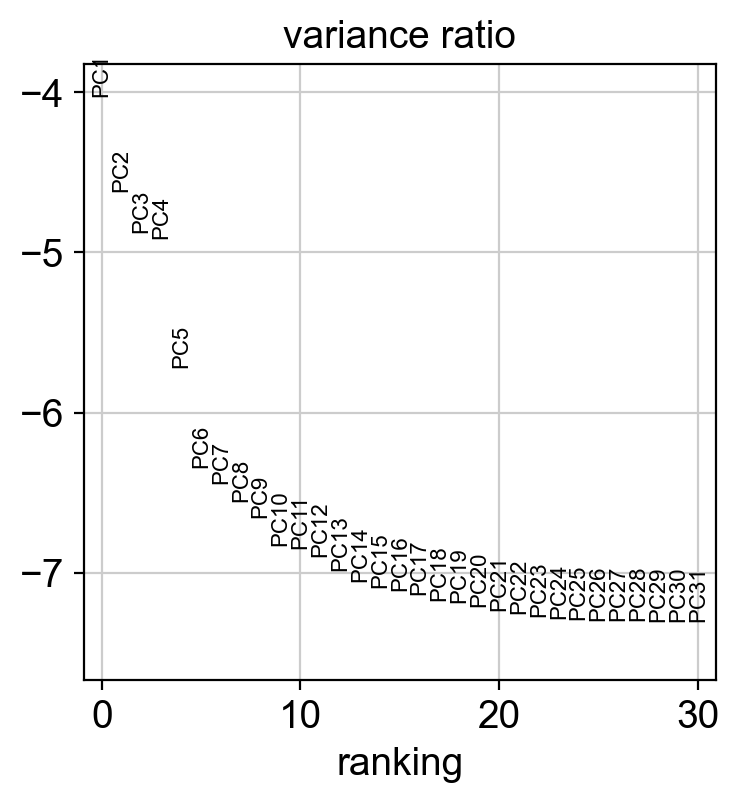

In [94]:
sc.pl.pca_variance_ratio(pbmc33k, log=True)

In [95]:
sc.pp.neighbors(pbmc33k, n_neighbors=10, n_pcs=10)

computing neighbors
    using 'X_pca' with n_pcs = 10
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)


In [96]:
sc.tl.umap(pbmc33k)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


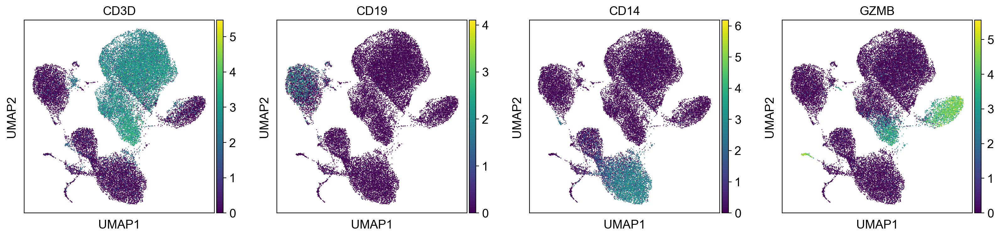

In [97]:
sc.pl.umap(pbmc33k, color=['CD3D', 'CD19','CD14','GZMB'])

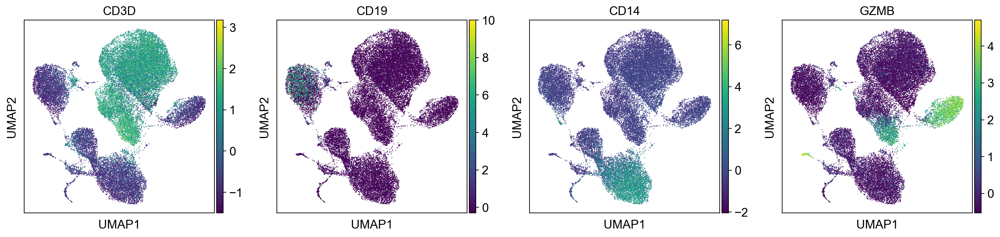

In [100]:
sc.pl.umap(pbmc33k, color=['CD3D', 'CD19','CD14','GZMB'], use_raw=False)

In [102]:
sc.tl.leiden(pbmc33k)

running Leiden clustering
    finished: found 22 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:04)


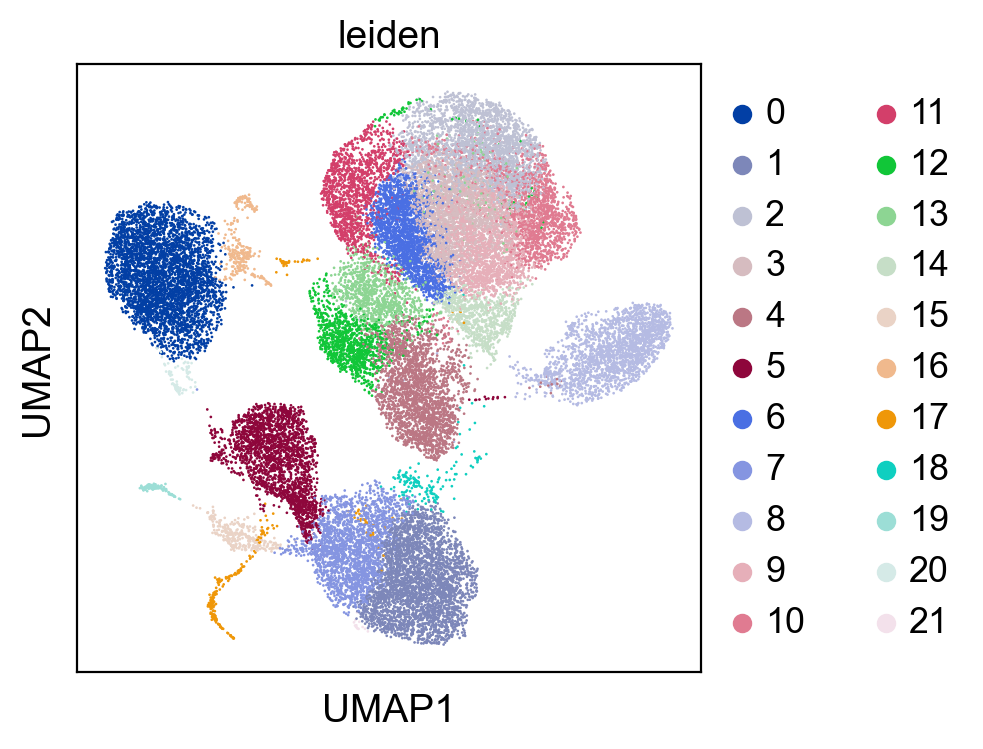

In [103]:
sc.pl.umap(pbmc33k, color=['leiden'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:39)


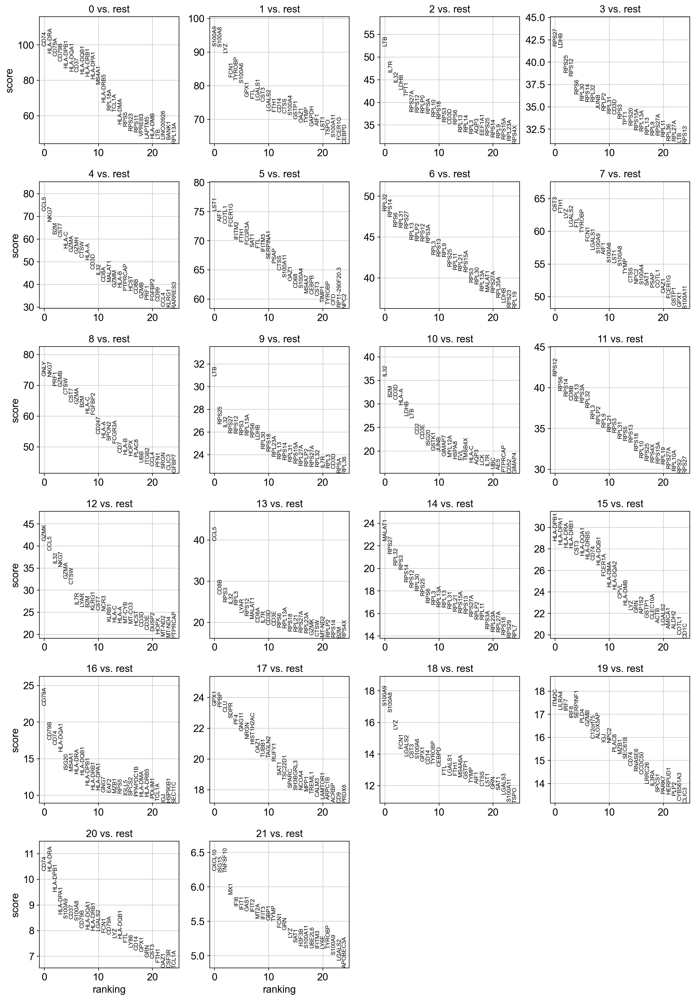

In [104]:
sc.tl.rank_genes_groups(pbmc33k, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(pbmc33k, n_genes=25, sharey=False)

In [144]:
pd.DataFrame(pbmc33k.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
0,CD74,S100A9,LTB,RPS27,CCL5,LST1,RPL32,CST3,GNLY,LTB,...,GZMK,CCL5,MALAT1,HLA-DPB1,CD79A,GPX1,S100A9,ITM2C,CD74,CXCL10
1,HLA-DRA,S100A8,IL7R,LDHB,NKG7,AIF1,RPS14,FTH1,NKG7,RPS25,...,CCL5,CD8B,RPS27,HLA-DPA1,CD79B,PPBP,S100A8,LILRA4,HLA-DRA,ISG15
2,CD79A,LYZ,IL32,RPS25,B2M,COTL1,RPS6,LYZ,PRF1,IL32,...,IL32,RPS3,RPL32,HLA-DRA,CD74,CLU,LYZ,IRF7,HLA-DPB1,TNFSF10
3,CD79B,FCN1,LDHB,RPS12,CST7,FCER1G,RPL31,LGALS2,GZMB,RPS27,...,NKG7,IL32,RPS3,HLA-DRB1,HLA-DQA1,SDPR,FCN1,IRF8,HLA-DPA1,MX1
4,HLA-DPB1,TYROBP,TPT1,RPS6,HLA-C,IFITM2,RPS27,FTL,CTSW,RPS12,...,GZMA,RPL3,RPS14,CST3,ISG20,PF4,LGALS2,SERPINF1,S100A9,IFI6
5,HLA-DQA1,S100A6,RPS27A,RPL30,GZMA,FTH1,RPL13,TYROBP,CST7,RPS3,...,CTSW,LYAR,RPS12,HLA-DQA1,MS4A1,GNG11,CST3,PLD4,CD37,IFIT1
6,CD37,GPX1,RPS12,RPS14,GZMH,FCGR3A,RPLP2,FCN1,GZMA,RPL13A,...,IL7R,RPS12,RPL30,HLA-DRB5,HLA-DRA,NRGN,S100A6,GZMB,S100A8,OAS1
7,HLA-DQB1,FTL,RPLP0,RPL32,CTSW,SAT1,RPS12,LGALS1,B2M,RPS6,...,LYAR,MALAT1,RPS25,CD74,HLA-DQB1,HIST1H2AC,GPX1,C12orf75,CD79B,IFIT2
8,HLA-DRB1,LGALS1,RPSA,JUNB,HLA-A,FTL,RPS3A,S100A9,HLA-C,LDHB,...,B2M,CD8A,RPS6,HLA-DQB1,HLA-DPB1,OAZ1,CD14,ALOX5AP,HLA-DQA1,MT2A
9,HLA-DPA1,CST3,RPL10,RPLP2,CD3D,IFITM3,RPL3,AIF1,FGFBP2,RPL30,...,KLRG1,IL7R,RPL3,FCER1A,HLA-DRB1,TUBB1,TYROBP,IGJ,HLA-DRB1,IFIT3


In [145]:
new_cluster_names = [
    'B1', 'neutrophil1',
    'CD4+ T1', 'CD8+ T1',
    'NKT1', 'macrophage1',
    'NKT2', 'macrophage2',
    'NK1', 'CD4+ T2',
    'T1', 'CD8+ T2', 'NK2',
    'CD8+ T3', 'T2',
    'dendritic cell1', 'B2',
    'megakaryocyte', 'neutrophil2',
    'dendritic cell2', 'B3',
    'NKT3'
    
]
pbmc33k.rename_categories('leiden', new_cluster_names)

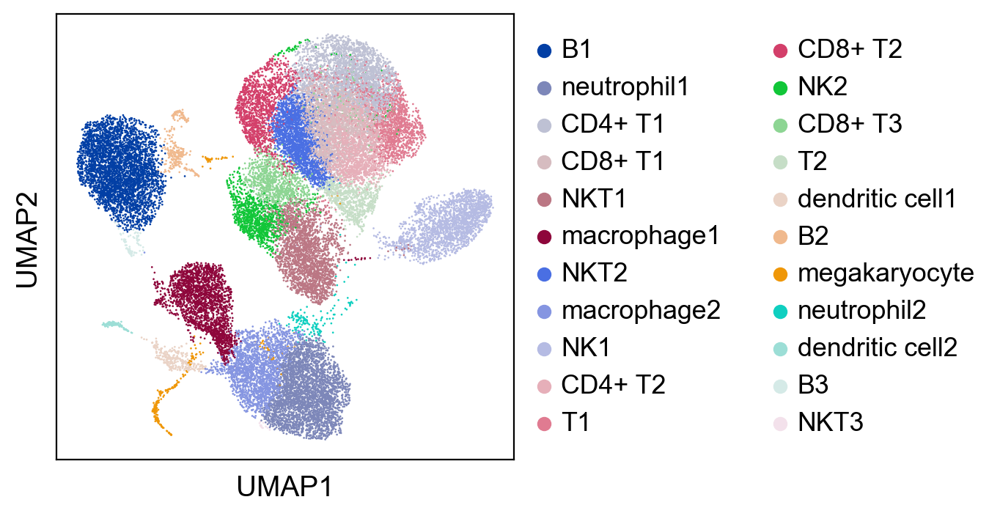

In [148]:
sc.pl.umap(pbmc33k, color='leiden', title='')

In [150]:
pbmc33k.obs

,n_genes_by_counts,total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mito,pct_counts_mito,total_counts_ribo,pct_counts_ribo,total_counts_mribo,pct_counts_mribo,n_genes,leiden
AAACATTGACGACT-1,713,1935.0,45.426357,60.930233,73.436693,88.992248,28.0,1.447028,806.0,41.653748,10.0,0.516796,713,NKT2
AAACATTGACGGGA-1,673,1342.0,39.120715,51.490313,64.754098,87.108793,40.0,2.980626,309.0,23.025335,3.0,0.223547,673,NK1
AAACATTGCCGCTT-1,354,720.0,47.222222,63.333333,78.611111,100.000000,13.0,1.805556,213.0,29.583332,2.0,0.277778,354,macrophage2
AAACATTGCTCATT-1,753,1604.0,38.279302,52.431421,65.523691,84.226933,52.0,3.241895,473.0,29.488777,6.0,0.374065,753,NK2
AAACCGTGCCCTCA-1,558,1313.0,44.402133,60.243717,72.734196,95.582635,26.0,1.980198,519.0,39.527798,3.0,0.228484,558,B1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGCATGCACTAG-6,662,1461.0,42.778919,56.399726,68.377823,88.911704,38.0,2.600958,459.0,31.416836,5.0,0.342231,662,NKT1
TTTGCATGCCGAAT-6,371,868.0,51.728111,67.050691,80.299539,100.000000,35.0,4.032258,354.0,40.783413,4.0,0.460829,371,CD8+ T3
TTTGCATGGAGGTG-6,1182,3104.0,36.146907,48.775773,61.565722,78.028351,93.0,2.996134,610.0,19.652061,10.0,0.322165,1182,macrophage1
TTTGCATGGATAAG-6,721,1665.0,42.762763,56.156156,68.708709,86.726727,32.0,1.921922,574.0,34.474476,5.0,0.300300,721,NKT1


In [185]:
pbmc33k.obs['celltype'] = pbmc33k.obs['leiden'].str.extract(r'^([A-Za-z\+0-9 ]+)(?<!\d{1}$)', expand=False)

... storing 'celltype' as categorical


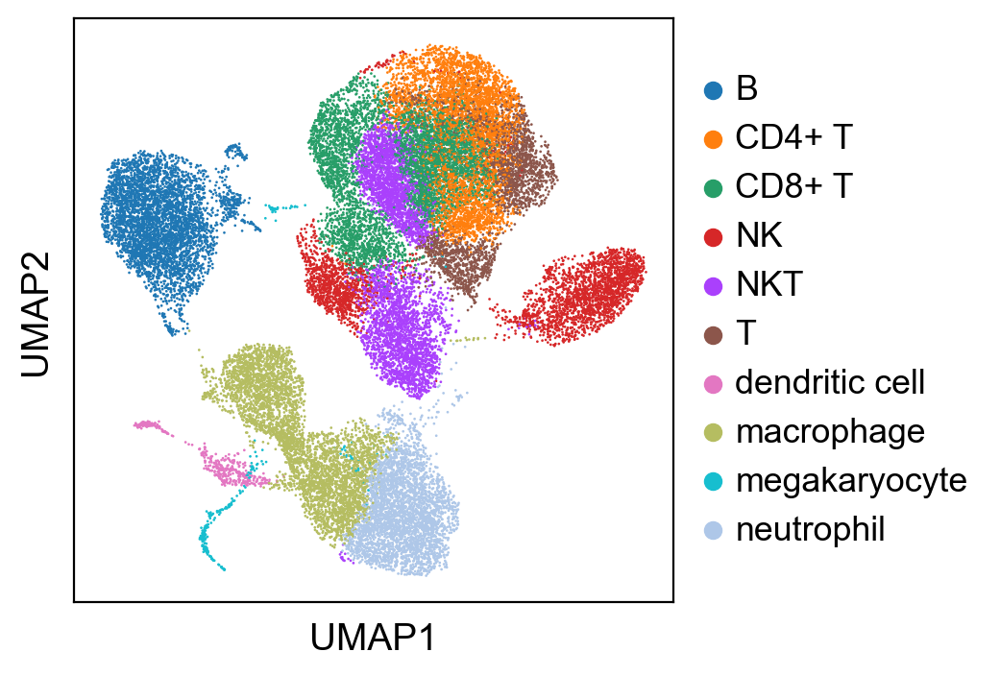

In [186]:
sc.pl.umap(pbmc33k, color='celltype', title='')

In [231]:
marker_genes = ['IL7R', 'CD79A', 'MS4A1', 'CD8A', 'CD8B', 'LYZ', 'CD14',
                'LGALS3', 'S100A8', 'GNLY', 'NKG7', 'KLRB1',
                'FCGR3A', 'MS4A7', 'FCER1A', 'CST3', 'PPBP']

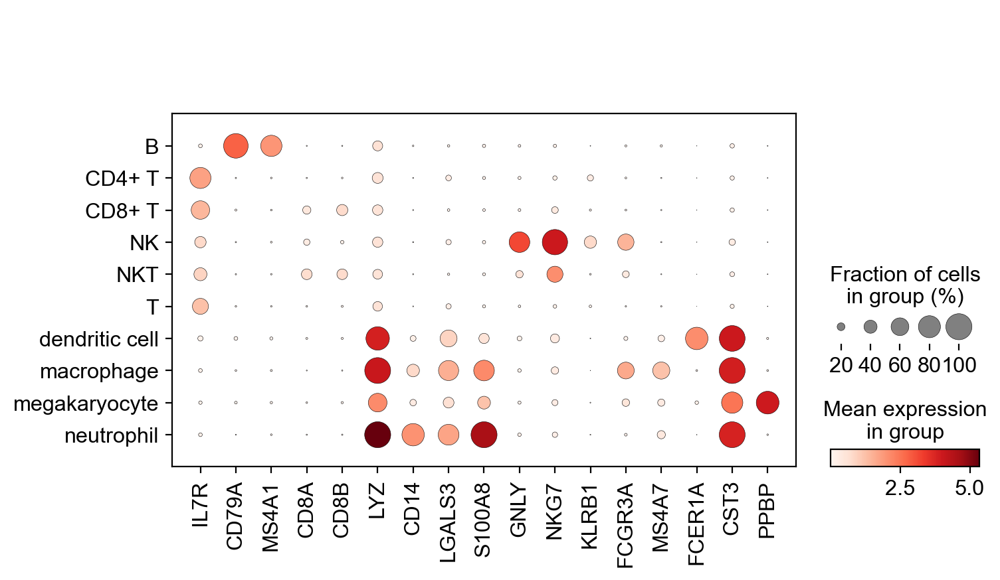

In [232]:
sc.pl.dotplot(pbmc33k, marker_genes, groupby='celltype')

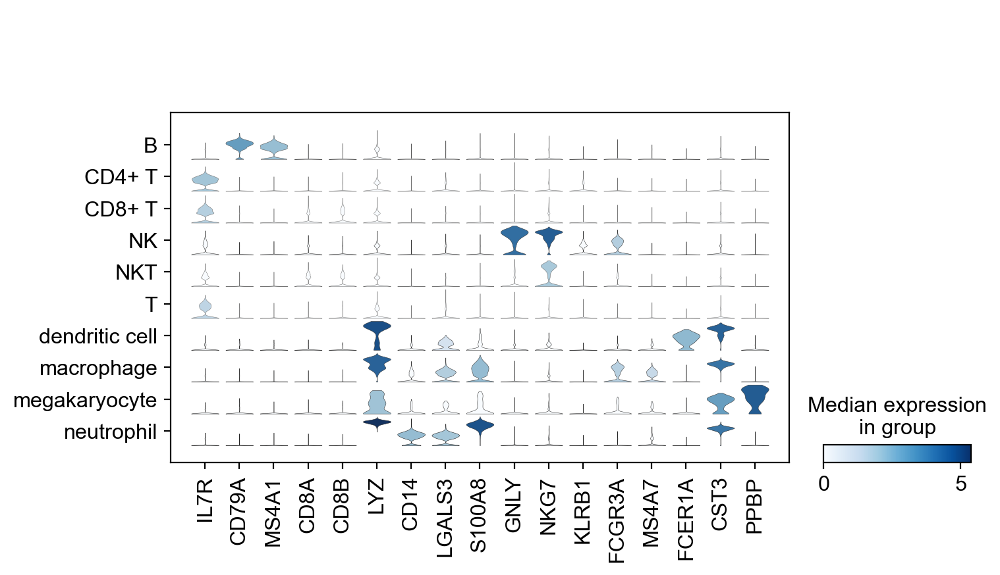

In [233]:
sc.pl.stacked_violin(pbmc33k, marker_genes, groupby='celltype', rotation=90);

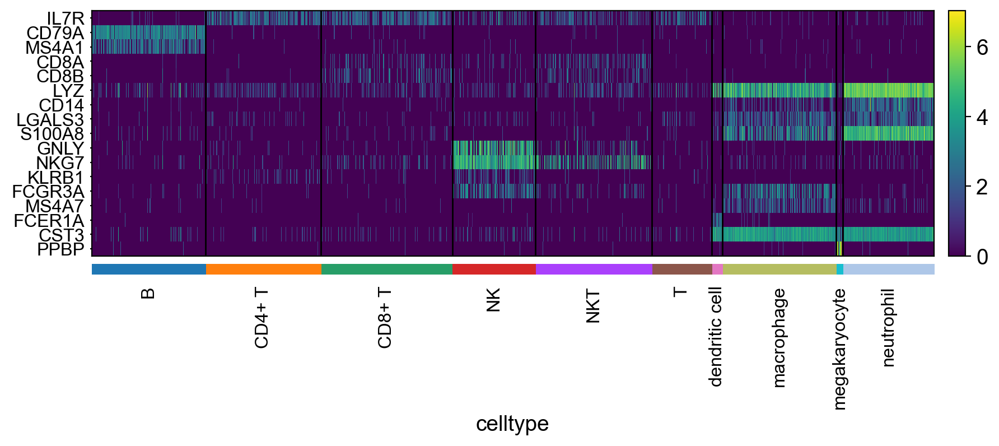

In [235]:
sc.pl.heatmap(pbmc33k, marker_genes, groupby='celltype', swap_axes=True)